In [1]:
import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize
import scipy.cluster.hierarchy as shc


In [2]:
# Load dataset

df = pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn.csv")
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [3]:
telco_dataset = pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn.csv")
df = telco_dataset.copy()

# Drop the unnecessary column
df.drop(['customerID'], axis=1, inplace=True)
df.head()

# Encoding Categorical Variables
binary_mappings = {
    'gender': {'Female': 0, 'Male': 1},
    'Partner': {'No': 0, 'Yes': 1},
    'Dependents': {'No': 0, 'Yes': 1},
    'PhoneService': {'No': 0, 'Yes': 1},
    'PaperlessBilling': {'No': 0, 'Yes': 1},
    'SeniorCitizen': {0: 0, 1: 1}
}
for col, mapping in binary_mappings.items():
    df[col] = df[col].map(mapping)

# Categorical variables for one-hot encoding
categorical_vars = [
    'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
    'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
    'Contract', 'PaymentMethod'
]
df = pd.get_dummies(df, columns=categorical_vars, drop_first=True)
df['Churn'] = df['Churn'].map({'No': 0, 'Yes': 1})

# Convert 'TotalCharges' to numeric and handle missing values
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df['TotalCharges'] = df['TotalCharges'].fillna(df['TotalCharges'].median())

# Scale the numeric columns
scaler = StandardScaler()
numeric_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

# Making the encoded version of the dataframe and save it as df_encoded
df_encoded = df


In [4]:
#Checking null values
print(df_encoded.isnull().sum())

gender                                   0
SeniorCitizen                            0
Partner                                  0
Dependents                               0
tenure                                   0
PhoneService                             0
PaperlessBilling                         0
MonthlyCharges                           0
TotalCharges                             0
Churn                                    0
MultipleLines_No phone service           0
MultipleLines_Yes                        0
InternetService_Fiber optic              0
InternetService_No                       0
OnlineSecurity_No internet service       0
OnlineSecurity_Yes                       0
OnlineBackup_No internet service         0
OnlineBackup_Yes                         0
DeviceProtection_No internet service     0
DeviceProtection_Yes                     0
TechSupport_No internet service          0
TechSupport_Yes                          0
StreamingTV_No internet service          0
StreamingTV

In [5]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 31 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   gender                                 7043 non-null   int64  
 1   SeniorCitizen                          7043 non-null   int64  
 2   Partner                                7043 non-null   int64  
 3   Dependents                             7043 non-null   int64  
 4   tenure                                 7043 non-null   float64
 5   PhoneService                           7043 non-null   int64  
 6   PaperlessBilling                       7043 non-null   int64  
 7   MonthlyCharges                         7043 non-null   float64
 8   TotalCharges                           7043 non-null   float64
 9   Churn                                  7043 non-null   int64  
 10  MultipleLines_No phone service         7043 non-null   bool   
 11  Mult

In [6]:
# Reduce dimensionality before clustering

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Select the numeric columns (already scaled)
X = df_encoded

# Apply PCA (reduce to 2 components)
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)

# Visualize the results (2D scatter plot)
""" plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], edgecolor='k', alpha=0.7, )
plt.title('PCA of Telco Customer Data (2 Components)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show() """

# Create a DataFrame with PCA components
pca_df = pd.DataFrame(X_pca, columns=['P1', 'P2'])
print(pca_df.head())


         P1        P2
0 -1.453271 -1.175006
1 -0.279679 -0.031804
2 -1.093929 -1.411923
3 -0.193600  0.364844
4 -0.764679 -2.011249


In [7]:
churn_data = pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn.csv")
churn_data = churn_data[['Churn']]
churn_data.head()

,Churn
0,No
1,No
2,Yes
3,No
4,Yes


In [8]:
data = pd.concat([pca_df,churn_data],axis=1)
data.head()

,P1,P2,Churn
0,-1.453271,-1.175006,No
1,-0.279679,-0.031804,No
2,-1.093929,-1.411923,Yes
3,-0.193600,0.364844,No
4,-0.764679,-2.011249,Yes


Maximum distance: 175.9891887930566
Maximum Distance Difference: 86.41463892182499
Threshold Set At Distance: 60.357461946571405


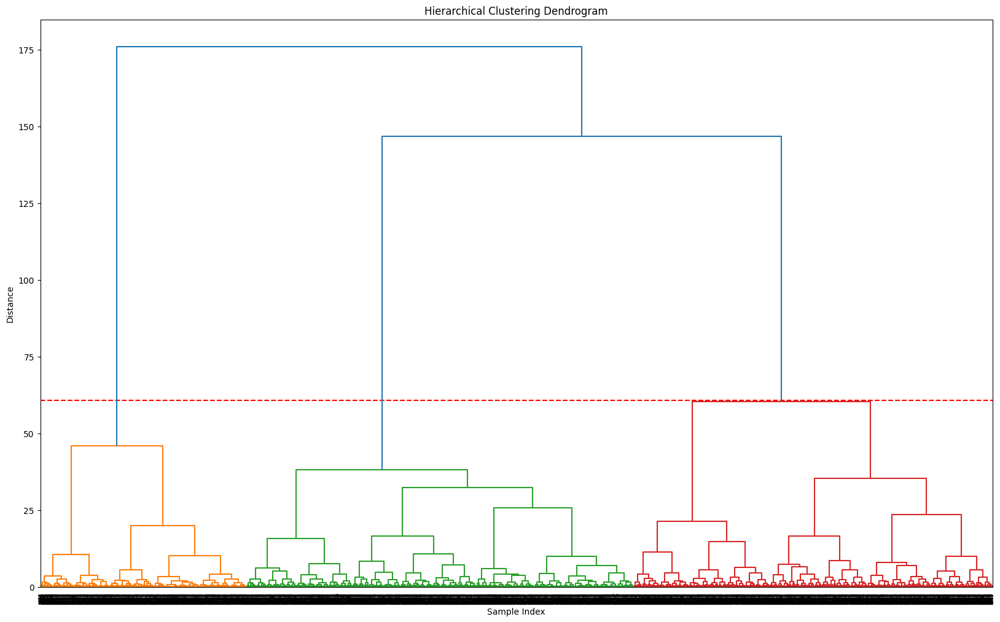

In [9]:
# Visualize using dendrogram

from scipy.cluster.hierarchy import dendrogram, linkage

# Extract distances
linked = linkage(pca_df, method='ward')
distances = linked[:, 2]

max_distance = np.max(distances)
print("Maximum distance:", max_distance)

distance_differences = np.diff(distances)
max_distance_difference = np.max(distance_differences)

threshold_index = np.argmax(distance_differences)
threshold = distances[threshold_index]

print("Maximum Distance Difference:", max_distance_difference)
print("Threshold Set At Distance:", threshold)

plt.figure(figsize=(20, 12))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')

plt.axhline(y=threshold+0.3, color='r', linestyle='--')

Dendrogram = shc.dendrogram(shc.linkage(pca_df, method = 'ward'))

##### Agglomerative Clustering (with PCA)

Davies-Bouldin Index for 2 clusters: 0.6819947996067732
Davies-Bouldin Index for 3 clusters: 0.629677922720214
Davies-Bouldin Index for 4 clusters: 0.7669518985875212
Davies-Bouldin Index for 5 clusters: 0.7066781778578581
Davies-Bouldin Index for 6 clusters: 0.8245792018582838
Davies-Bouldin Index for 7 clusters: 0.8556608102032536
Davies-Bouldin Index for 8 clusters: 0.8753546094560654
Davies-Bouldin Index for 9 clusters: 0.8055230903800693
Davies-Bouldin Index for 10 clusters: 0.7940874850083722
Davies-Bouldin Index for 11 clusters: 0.8019277698887181
Davies-Bouldin Index for 12 clusters: 0.8027053399228293
Davies-Bouldin Index for 13 clusters: 0.8306860090350003


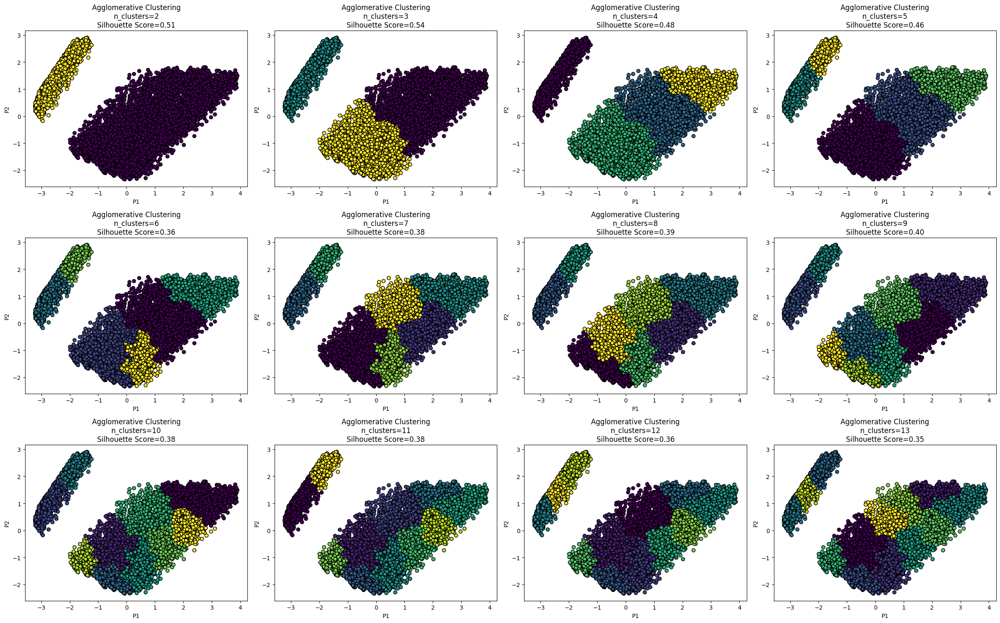

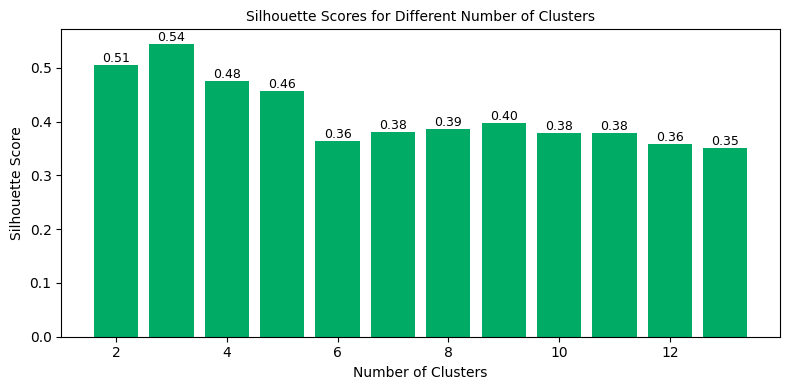

In [73]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score

n_clusters_range = range(2, 14)
fig, axs = plt.subplots(3, 4, figsize=(24, 15))
axs = axs.flatten()

silhouette_scores = []

for idx, n_clusters in enumerate(n_clusters_range):
    # Agglomerative model
    model = AgglomerativeClustering(n_clusters=n_clusters)
    labels = model.fit_predict(pca_df)

    # Calculate Silhouette Score
    score = silhouette_score(pca_df, labels,  metric='euclidean')
    silhouette_scores.append(score)

    axs[idx].scatter(pca_df['P1'], pca_df['P2'], c=labels, cmap='viridis', edgecolor='k')
    axs[idx].set_title(f'Agglomerative Clustering\nn_clusters={n_clusters}\nSilhouette Score={score:.2f}')
    axs[idx].set_xlabel('P1')
    axs[idx].set_ylabel('P2')

    # Calculate Davies-Bouldin Index
    db_score = davies_bouldin_score(pca_df, labels)
    print(f"Davies-Bouldin Index for {n_clusters} clusters: {db_score}")

plt.tight_layout()
plt.show()

# Plot silhouette scores
plt.figure(figsize=(8, 4))
bars = plt.bar(n_clusters_range, silhouette_scores, color='#00AB66')

plt.xlabel('Number of Clusters', fontsize=10)
plt.ylabel('Silhouette Score', fontsize=10)
plt.title('Silhouette Scores for Different Number of Clusters', fontsize=10)

for bar, score in zip(bars, silhouette_scores):
    plt.text(bar.get_x() + bar.get_width() / 2,
             bar.get_height(),
             f'{score:.2f}',
             ha='center',
             va='bottom',
             fontsize=9)

plt.tight_layout()
plt.show()



In [11]:
df_cluster = df_encoded.copy()

#Selecting all variables except tenure and Monthly Charges
encoder = OrdinalEncoder()
df_cluster[df_cluster.columns[~df_cluster.columns.isin(['tenure','MonthlyCharges', 'TotalCharges'])]] = encoder.fit_transform(df_cluster[df_cluster.columns[~df_cluster.columns.isin(['tenure','MonthlyCharges', 'TotalCharges'])]])

In [12]:
agglomerative = AgglomerativeClustering(n_clusters = 3)
agglomerative.fit(df_cluster)
df_cluster['Cluster'] = agglomerative.labels_

In [13]:
df_cluster
#df_cluster.to_csv('pca_cluster.csv')

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,...,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Cluster
0,0.0,0.0,1.0,0.0,-1.277445,0.0,1.0,-1.160323,-0.994242,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2
1,1.0,0.0,0.0,0.0,0.066327,1.0,0.0,-0.259629,-0.173244,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2
2,1.0,0.0,0.0,0.0,-1.236724,1.0,1.0,-0.362660,-0.959674,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2
3,1.0,0.0,0.0,0.0,0.514251,0.0,0.0,-0.746535,-0.194766,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0
4,0.0,0.0,0.0,0.0,-1.236724,1.0,1.0,0.197365,-0.940470,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1.0,0.0,1.0,1.0,-0.340876,1.0,1.0,0.665992,-0.128655,0.0,...,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,2
7039,0.0,0.0,1.0,1.0,1.613701,1.0,1.0,1.277533,2.243151,0.0,...,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0
7040,0.0,0.0,1.0,1.0,-0.870241,0.0,1.0,-1.168632,-0.854469,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2
7041,1.0,1.0,1.0,0.0,-1.155283,1.0,1.0,0.320338,-0.872062,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2


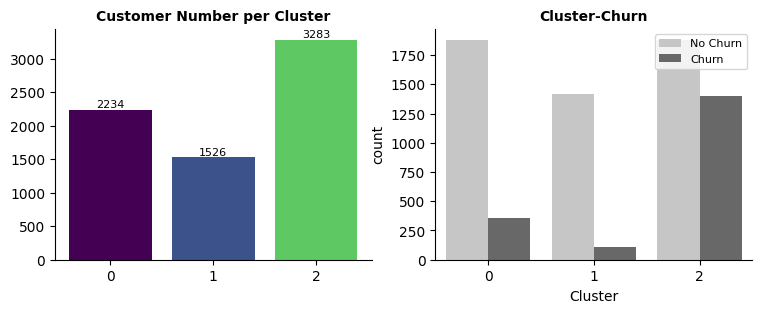

In [14]:
# Cluster Counts
fig, ax = plt.subplots(1,2, figsize=(9, 3))
data_temp = df_cluster['Cluster'].value_counts().sort_index()
ax[0].bar(data_temp.index, data_temp,
          color=['#440154', '#3b528b', '#5ec962']
        )
ax[0].set_xticks([0, 1, 2])
ax[0].set_xticklabels([0, 1, 2])
ax[0].set_title('Customer Number per Cluster', fontsize=10, fontweight='bold')
for i in data_temp.index:
    ax[0].annotate(f"{data_temp[i]}",
                   xy=(i, data_temp[i] + 80),
                   va = 'center', ha='center',fontweight='light',
                   color='black', fontsize=8)
for s in ['top', 'right']:
    ax[0].spines[s].set_visible(False)


sn.countplot(x='Cluster', hue="Churn", palette="Greys", data = df_cluster)
sn.despine()
plt.legend(title='', loc='upper right', labels=['No Churn', 'Churn'], fontsize=8)
plt.title("Cluster-Churn", fontsize=10,fontweight='bold')
plt.show()

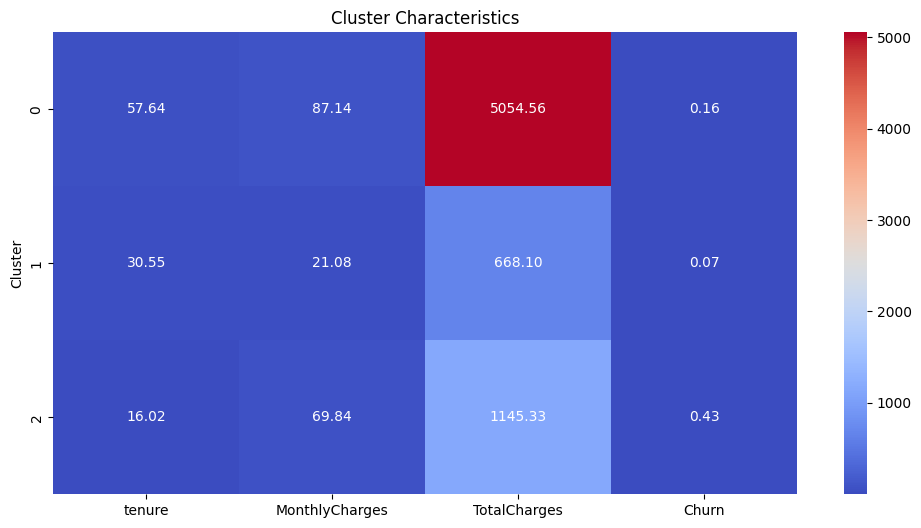

    gender  SeniorCitizen Partner Dependents  tenure PhoneService  \
3     Male              0      No         No      45           No   
8   Female              0     Yes         No      28          Yes   
9     Male              0      No        Yes      62          Yes   
12    Male              0     Yes         No      58          Yes   
13    Male              0      No         No      49          Yes   

       MultipleLines InternetService OnlineSecurity OnlineBackup  ...  \
3   No phone service             DSL            Yes           No  ...   
8                Yes     Fiber optic             No           No  ...   
9                 No             DSL            Yes          Yes  ...   
12               Yes     Fiber optic             No           No  ...   
13               Yes     Fiber optic             No          Yes  ...   

   TechSupport StreamingTV StreamingMovies        Contract PaperlessBilling  \
3          Yes          No              No        One year         

In [15]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

telco_dataset = pd.read_csv("./WA_Fn-UseC_-Telco-Customer-Churn.csv")
df = telco_dataset.copy()

df = df.drop(columns=['customerID'])

# Convert Churn to binary
df['Churn'] = df['Churn'].map({'No': 0, 'Yes': 1})

# Select Relevant Features for Clustering
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df['TotalCharges'] = df['TotalCharges'].fillna(df['TotalCharges'].median())

features = ['tenure', 'MonthlyCharges', 'TotalCharges', 'Churn']

scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[features])

cluster_labels = agglomerative.labels_
df['Cluster'] = cluster_labels

# Analyze Each Cluster (calculate the mean of each feature for each cluster)
cluster_summary = df.groupby('Cluster')[features].mean()

plt.figure(figsize=(12, 6))
sns.heatmap(cluster_summary, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Cluster Characteristics')
plt.show()

# Save or Analyze Specific Clusters
cluster_0_customers = df[df['Cluster'] == 0]
print(cluster_0_customers.head())


##### Agglomerative Clustering (with TSNE)

In [16]:
# Agglomerative Clustering (using TSNE)

from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize
from sklearn.decomposition import PCA
import scipy.cluster.hierarchy as shc
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score

df = pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn.csv")
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [17]:
telco_dataset = pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn.csv")
df = telco_dataset.copy()

# Drop the unnecessary column
df.drop(['customerID'], axis=1, inplace=True)
df.head()

# Encoding Categorical Variables
binary_mappings = {
    'gender': {'Female': 0, 'Male': 1},
    'Partner': {'No': 0, 'Yes': 1},
    'Dependents': {'No': 0, 'Yes': 1},
    'PhoneService': {'No': 0, 'Yes': 1},
    'PaperlessBilling': {'No': 0, 'Yes': 1},
    'SeniorCitizen': {0: 0, 1: 1}
}
for col, mapping in binary_mappings.items():
    df[col] = df[col].map(mapping)

# Categorical variables for one-hot encoding
categorical_vars = [
    'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
    'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
    'Contract', 'PaymentMethod'
]
df = pd.get_dummies(df, columns=categorical_vars, drop_first=True)
df['Churn'] = df['Churn'].map({'No': 0, 'Yes': 1})

# Convert 'TotalCharges' to numeric and handle missing values
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df['TotalCharges'] = df['TotalCharges'].fillna(df['TotalCharges'].median())

# Scale the numeric columns
scaler = StandardScaler()
numeric_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

# Making the encoded version of the dataframe and save it as df_encoded
df_encoded = df



In [18]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Select the numeric columns (already scaled)
X = df_encoded

# Apply t-SNE (reduce to 2 components)
tsne = TSNE(n_components=2, random_state=42)  
X_tsne = tsne.fit_transform(X)

""" # Visualize the results (2D scatter plot)
plt.figure(figsize=(8, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], edgecolor='k', alpha=0.7)
plt.title('t-SNE of Telco Customer Data (2 Components)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show() """

# Create a DataFrame with t-SNE components
tsne_df = pd.DataFrame(X_tsne, columns=['T1', 'T2'])
print(tsne_df.head())


          T1         T2
0 -56.275215 -39.260738
1 -12.705464 -17.696566
2 -21.146423 -44.413265
3 -42.793457 -28.588926
4  41.624001 -57.998722


In [19]:
churn_data = pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn.csv")
churn_data = churn_data[['Churn']]
churn_data.head()

,Churn
0,No
1,No
2,Yes
3,No
4,Yes


In [20]:
data = pd.concat([tsne_df,churn_data],axis=1)
data.head()

,T1,T2,Churn
0,-56.275215,-39.260738,No
1,-12.705464,-17.696566,No
2,-21.146423,-44.413265,Yes
3,-42.793457,-28.588926,No
4,41.624001,-57.998722,Yes


Maximum distance: 3978.641082584653
Maximum Distance Difference: 1115.5549088150972
Threshold Set At Distance: 1875.0538178523423


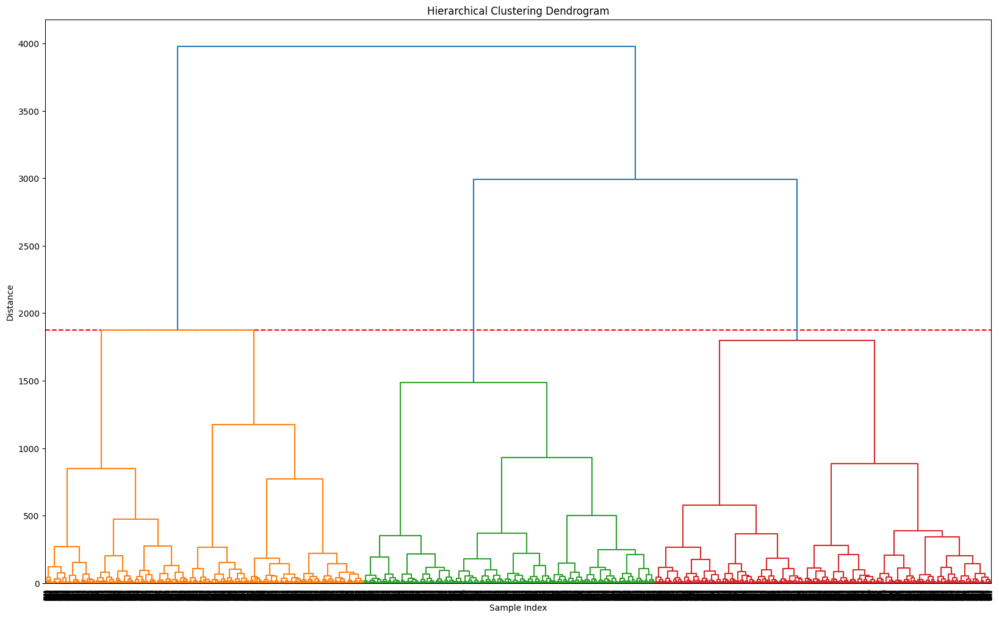

In [22]:
# Visualize using dendrogram

from scipy.cluster.hierarchy import dendrogram, linkage

# Extract distances
linked = linkage(tsne_df, method='ward')
distances = linked[:, 2]

max_distance = np.max(distances)
print("Maximum distance:", max_distance)

distance_differences = np.diff(distances)
max_distance_difference = np.max(distance_differences)

threshold_index = np.argmax(distance_differences)
threshold = distances[threshold_index]

print("Maximum Distance Difference:", max_distance_difference)
print("Threshold Set At Distance:", threshold)

plt.figure(figsize=(20, 12))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')

plt.axhline(y=threshold+0.3, color='r', linestyle='--')

Dendrogram = shc.dendrogram(shc.linkage(tsne_df, method = 'ward'))

Davies-Bouldin Index for 2 clusters: 1.082833811578678
Davies-Bouldin Index for 3 clusters: 0.9866997140681111
Davies-Bouldin Index for 4 clusters: 0.9335819439171281
Davies-Bouldin Index for 5 clusters: 0.8427282490616482
Davies-Bouldin Index for 6 clusters: 0.8569857560711608
Davies-Bouldin Index for 7 clusters: 0.8053367409768697
Davies-Bouldin Index for 8 clusters: 0.788874669403016
Davies-Bouldin Index for 9 clusters: 0.7892401119556847
Davies-Bouldin Index for 10 clusters: 0.7953841612808066
Davies-Bouldin Index for 11 clusters: 0.7585485147711263
Davies-Bouldin Index for 12 clusters: 0.8230713595954455
Davies-Bouldin Index for 13 clusters: 0.7983075014084929


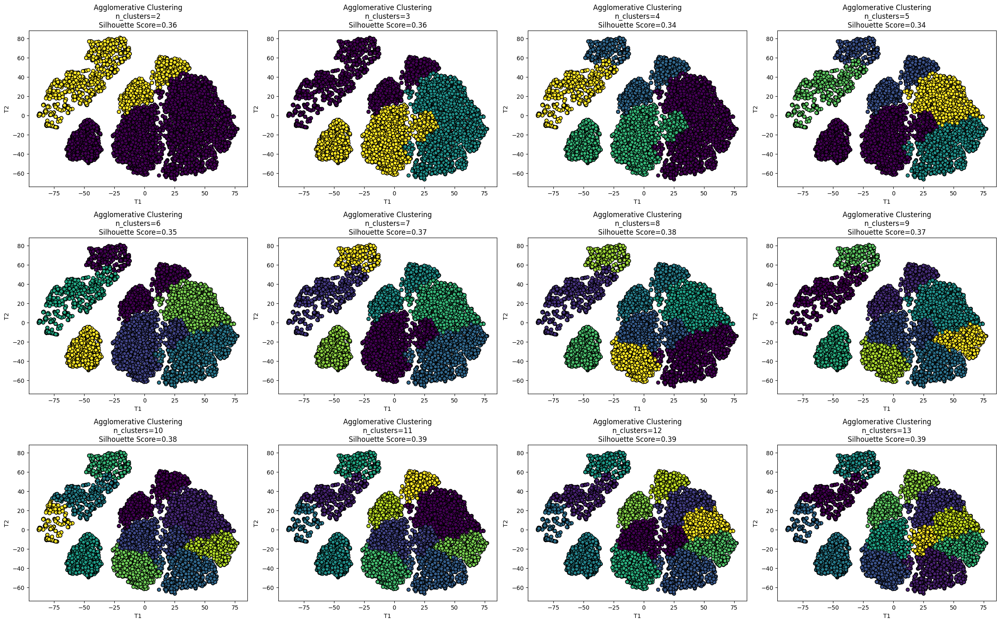

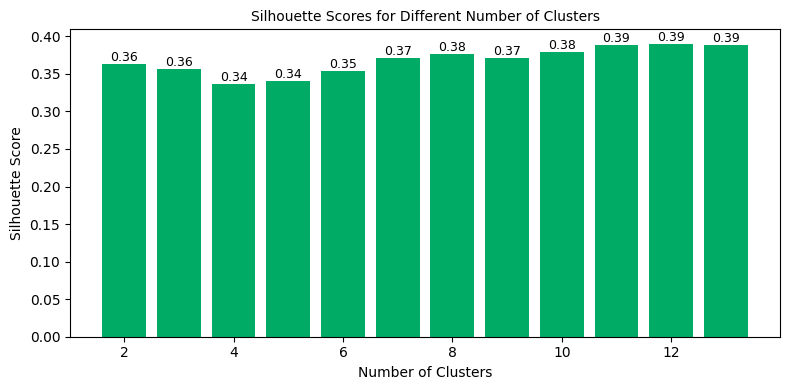

In [71]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt

n_clusters_range = range(2, 14)  
fig, axs = plt.subplots(3, 4, figsize=(24, 15))  
axs = axs.flatten()  

silhouette_scores = []  

for idx, n_clusters in enumerate(n_clusters_range):
    model = AgglomerativeClustering(n_clusters=n_clusters)
    labels = model.fit_predict(tsne_df)  

    # Calculate the silhouette score
    score = silhouette_score(tsne_df, labels, metric='euclidean')
    silhouette_scores.append(score)

    axs[idx].scatter(tsne_df['T1'], tsne_df['T2'], c=labels, cmap='viridis', edgecolor='k')
    axs[idx].set_title(f'Agglomerative Clustering\nn_clusters={n_clusters}\nSilhouette Score={score:.2f}')
    axs[idx].set_xlabel('T1')
    axs[idx].set_ylabel('T2')

    # Calculate Davies-Bouldin Index
    db_score = davies_bouldin_score(tsne_df, labels)
    print(f"Davies-Bouldin Index for {n_clusters} clusters: {db_score}")

plt.tight_layout()  
plt.show()

# Plot silhouette scores 
plt.figure(figsize=(8, 4))
bars = plt.bar(n_clusters_range, silhouette_scores, color='#00AB66')

plt.xlabel('Number of Clusters', fontsize=10)
plt.ylabel('Silhouette Score', fontsize=10)
plt.title('Silhouette Scores for Different Number of Clusters', fontsize=10)

for bar, score in zip(bars, silhouette_scores):
    plt.text(bar.get_x() + bar.get_width() / 2,
             bar.get_height(),
             f'{score:.2f}',
             ha='center',
             va='bottom',
             fontsize=9)

plt.tight_layout()
plt.show()

In [24]:
df_cluster = df_encoded.copy()

#Selecting all variables except tenure and Monthly Charges
encoder = OrdinalEncoder()
df_cluster[df_cluster.columns[~df_cluster.columns.isin(['tenure','MonthlyCharges', 'TotalCharges'])]] = encoder.fit_transform(df_cluster[df_cluster.columns[~df_cluster.columns.isin(['tenure','MonthlyCharges', 'TotalCharges'])]])

In [25]:
agglomerative = AgglomerativeClustering(n_clusters = 3)
agglomerative.fit(df_cluster)
df_cluster['Cluster'] = agglomerative.labels_

In [26]:
df_cluster
#df_cluster.to_csv('tsne_cluster.csv')

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,...,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Cluster
0,0.0,0.0,1.0,0.0,-1.277445,0.0,1.0,-1.160323,-0.994242,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2
1,1.0,0.0,0.0,0.0,0.066327,1.0,0.0,-0.259629,-0.173244,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2
2,1.0,0.0,0.0,0.0,-1.236724,1.0,1.0,-0.362660,-0.959674,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2
3,1.0,0.0,0.0,0.0,0.514251,0.0,0.0,-0.746535,-0.194766,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0
4,0.0,0.0,0.0,0.0,-1.236724,1.0,1.0,0.197365,-0.940470,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1.0,0.0,1.0,1.0,-0.340876,1.0,1.0,0.665992,-0.128655,0.0,...,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,2
7039,0.0,0.0,1.0,1.0,1.613701,1.0,1.0,1.277533,2.243151,0.0,...,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0
7040,0.0,0.0,1.0,1.0,-0.870241,0.0,1.0,-1.168632,-0.854469,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2
7041,1.0,1.0,1.0,0.0,-1.155283,1.0,1.0,0.320338,-0.872062,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2


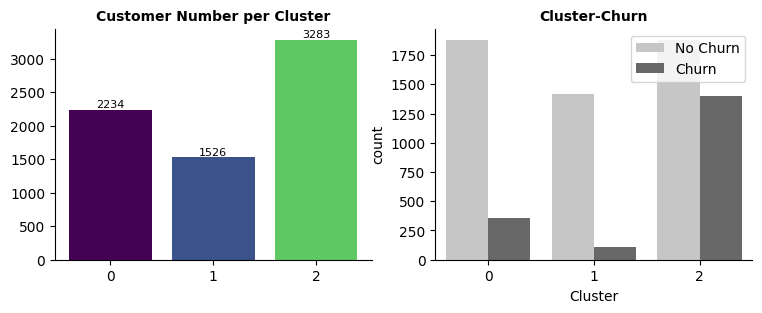

In [27]:
# Cluster Counts
fig, ax = plt.subplots(1,2, figsize=(9, 3))
data_temp = df_cluster['Cluster'].value_counts().sort_index()
ax[0].bar(data_temp.index, data_temp,
          color=['#440154', '#3b528b', '#5ec962']
        )
ax[0].set_xticks([0, 1, 2])
ax[0].set_xticklabels([0, 1, 2])
ax[0].set_title('Customer Number per Cluster', fontsize=10, fontweight='bold')
for i in data_temp.index:
    ax[0].annotate(f"{data_temp[i]}",
                   xy=(i, data_temp[i] + 80),
                   va = 'center', ha='center',fontweight='light',
                   color='black', fontsize=8)
for s in ['top', 'right']:
    ax[0].spines[s].set_visible(False)


sn.countplot(x='Cluster', hue="Churn", palette="Greys", data = df_cluster)
sn.despine()
plt.legend(title='', loc='upper right', labels=['No Churn', 'Churn'])
plt.title("Cluster-Churn", fontsize=10,fontweight='bold')
plt.show()

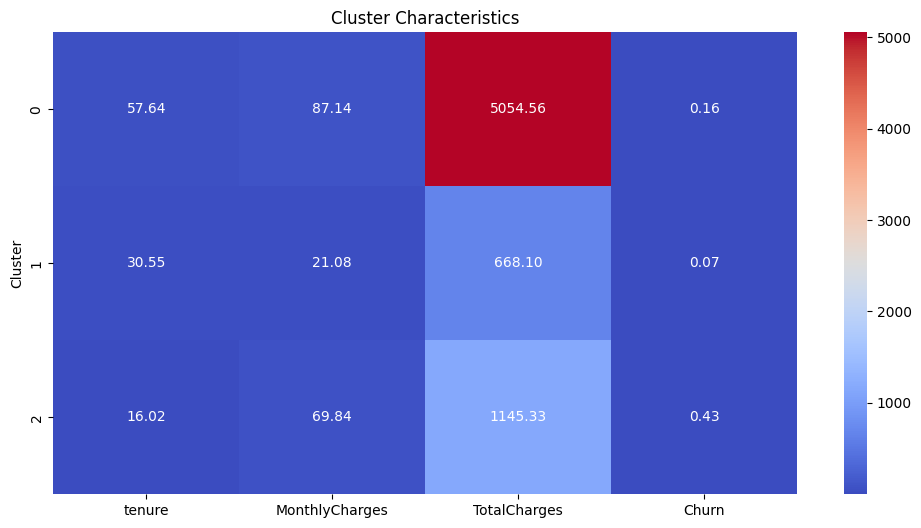

    gender  SeniorCitizen Partner Dependents  tenure PhoneService  \
3     Male              0      No         No      45           No   
8   Female              0     Yes         No      28          Yes   
9     Male              0      No        Yes      62          Yes   
12    Male              0     Yes         No      58          Yes   
13    Male              0      No         No      49          Yes   

       MultipleLines InternetService OnlineSecurity OnlineBackup  ...  \
3   No phone service             DSL            Yes           No  ...   
8                Yes     Fiber optic             No           No  ...   
9                 No             DSL            Yes          Yes  ...   
12               Yes     Fiber optic             No           No  ...   
13               Yes     Fiber optic             No          Yes  ...   

   TechSupport StreamingTV StreamingMovies        Contract PaperlessBilling  \
3          Yes          No              No        One year         

In [28]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

telco_dataset = pd.read_csv("./WA_Fn-UseC_-Telco-Customer-Churn.csv")
df = telco_dataset.copy()

df = df.drop(columns=['customerID'])

# Convert Churn to binary
df['Churn'] = df['Churn'].map({'No': 0, 'Yes': 1})

# Select Relevant Features for Clustering
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df['TotalCharges'] = df['TotalCharges'].fillna(df['TotalCharges'].median())

features = ['tenure', 'MonthlyCharges', 'TotalCharges', 'Churn']

scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[features])

model = AgglomerativeClustering(n_clusters=n_clusters)
labels = model.fit_predict(tsne_df)  

cluster_labels = agglomerative.labels_
df['Cluster'] = cluster_labels

# Analyze Each Cluster (calculate the mean of each feature for each cluster)
cluster_summary = df.groupby('Cluster')[features].mean()

plt.figure(figsize=(12, 6))
sns.heatmap(cluster_summary, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Cluster Characteristics')
plt.show()

# Save or Analyze Specific Clusters
cluster_0_customers = df[df['Cluster'] == 0]
print(cluster_0_customers.head())


In [29]:
# AC with PCA - visualization for 11 clusters

df_cluster = df_encoded.copy()

#Selecting all variables except tenure and Monthly Charges
encoder = OrdinalEncoder()
df_cluster[df_cluster.columns[~df_cluster.columns.isin(['tenure','MonthlyCharges', 'TotalCharges'])]] = encoder.fit_transform(df_cluster[df_cluster.columns[~df_cluster.columns.isin(['tenure','MonthlyCharges', 'TotalCharges'])]])


In [30]:
agglomerative = AgglomerativeClustering(n_clusters = 11)
agglomerative.fit(df_cluster)
df_cluster['Cluster'] = agglomerative.labels_

In [31]:
df_cluster
#df_cluster.to_csv('tsne_cluster.csv')

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,...,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Cluster
0,0.0,0.0,1.0,0.0,-1.277445,0.0,1.0,-1.160323,-0.994242,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,9
1,1.0,0.0,0.0,0.0,0.066327,1.0,0.0,-0.259629,-0.173244,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,10
2,1.0,0.0,0.0,0.0,-1.236724,1.0,1.0,-0.362660,-0.959674,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,6
3,1.0,0.0,0.0,0.0,0.514251,0.0,0.0,-0.746535,-0.194766,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,7
4,0.0,0.0,0.0,0.0,-1.236724,1.0,1.0,0.197365,-0.940470,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1.0,0.0,1.0,1.0,-0.340876,1.0,1.0,0.665992,-0.128655,0.0,...,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,10
7039,0.0,0.0,1.0,1.0,1.613701,1.0,1.0,1.277533,2.243151,0.0,...,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1
7040,0.0,0.0,1.0,1.0,-0.870241,0.0,1.0,-1.168632,-0.854469,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,9
7041,1.0,1.0,1.0,0.0,-1.155283,1.0,1.0,0.320338,-0.872062,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2


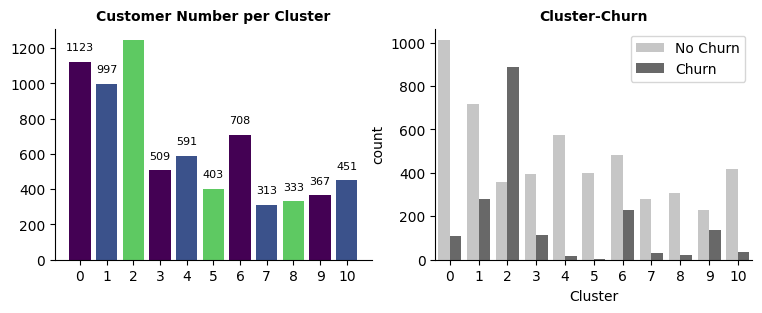

In [32]:
# Cluster Counts
fig, ax = plt.subplots(1,2, figsize=(9, 3))
data_temp = df_cluster['Cluster'].value_counts().sort_index()
ax[0].bar(data_temp.index, data_temp,
          color=['#440154', '#3b528b', '#5ec962', '#440154', '#3b528b', '#5ec962', '#440154', '#3b528b', '#5ec962', '#440154', '#3b528b']
        )
ax[0].set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
ax[0].set_xticklabels([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
ax[0].set_title('Customer Number per Cluster', fontsize=10, fontweight='bold')
for i in data_temp.index:
    ax[0].annotate(f"{data_temp[i]}",
                   xy=(i, data_temp[i] + 80),
                   va = 'center', ha='center',fontweight='light',
                   color='black', fontsize=8)
for s in ['top', 'right']:
    ax[0].spines[s].set_visible(False)


sn.countplot(x='Cluster', hue="Churn", palette="Greys", data = df_cluster)
sn.despine()
plt.legend(title='', loc='upper right', labels=['No Churn', 'Churn'])
plt.title("Cluster-Churn", fontsize=10,fontweight='bold')
plt.show()

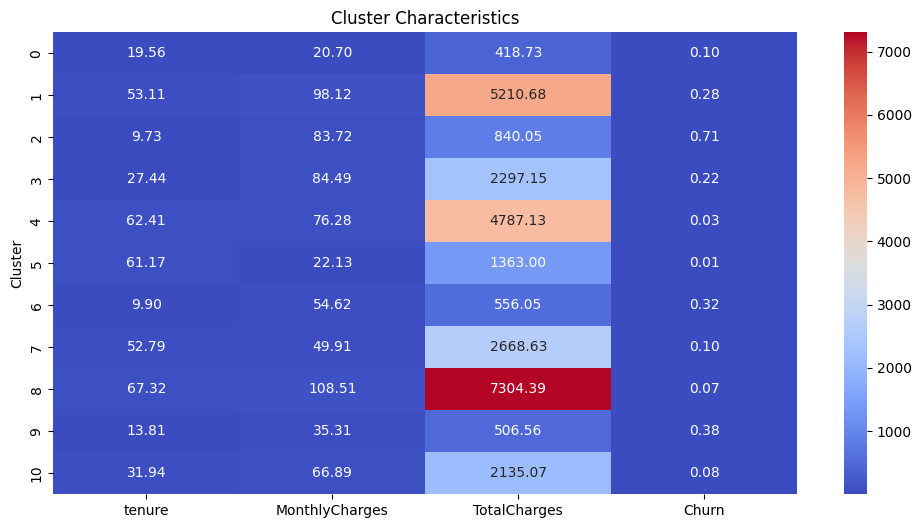

    gender  SeniorCitizen Partner Dependents  tenure PhoneService  \
11    Male              0      No         No      16          Yes   
16  Female              0      No         No      52          Yes   
21    Male              0     Yes         No      12          Yes   
22    Male              0      No         No       1          Yes   
33    Male              0      No         No       1          Yes   

   MultipleLines InternetService       OnlineSecurity         OnlineBackup  \
11            No              No  No internet service  No internet service   
16            No              No  No internet service  No internet service   
21            No              No  No internet service  No internet service   
22            No              No  No internet service  No internet service   
33            No              No  No internet service  No internet service   

    ...          TechSupport          StreamingTV      StreamingMovies  \
11  ...  No internet service  No internet 

In [33]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

telco_dataset = pd.read_csv("./WA_Fn-UseC_-Telco-Customer-Churn.csv")
df = telco_dataset.copy()

df = df.drop(columns=['customerID'])

# Convert Churn to binary
df['Churn'] = df['Churn'].map({'No': 0, 'Yes': 1})

# Select Relevant Features for Clustering
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df['TotalCharges'] = df['TotalCharges'].fillna(df['TotalCharges'].median())

features = ['tenure', 'MonthlyCharges', 'TotalCharges', 'Churn']

scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[features])

model = AgglomerativeClustering(n_clusters=n_clusters)
labels = model.fit_predict(tsne_df)  

cluster_labels = agglomerative.labels_
df['Cluster'] = cluster_labels

# Analyze Each Cluster (calculate the mean of each feature for each cluster)
cluster_summary = df.groupby('Cluster')[features].mean()

plt.figure(figsize=(12, 6))
sns.heatmap(cluster_summary, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Cluster Characteristics')
plt.show()

# Save or Analyze Specific Clusters
cluster_0_customers = df[df['Cluster'] == 0]
print(cluster_0_customers.head())


##### KMeans (with PCA)

Davies-Bouldin Index for 2 clusters: 0.9380599290295272
Davies-Bouldin Index for 3 clusters: 0.621401771759326
Davies-Bouldin Index for 4 clusters: 0.764489851091752
Davies-Bouldin Index for 5 clusters: 0.7160542158559837
Davies-Bouldin Index for 6 clusters: 0.8250471057374446
Davies-Bouldin Index for 7 clusters: 0.814636803875712
Davies-Bouldin Index for 8 clusters: 0.7932229598419681
Davies-Bouldin Index for 9 clusters: 0.7633920328626504
Davies-Bouldin Index for 10 clusters: 0.7614311271528659
Davies-Bouldin Index for 11 clusters: 0.7508201478546258
Davies-Bouldin Index for 12 clusters: 0.7336954255724777
Davies-Bouldin Index for 13 clusters: 0.7513276199389018


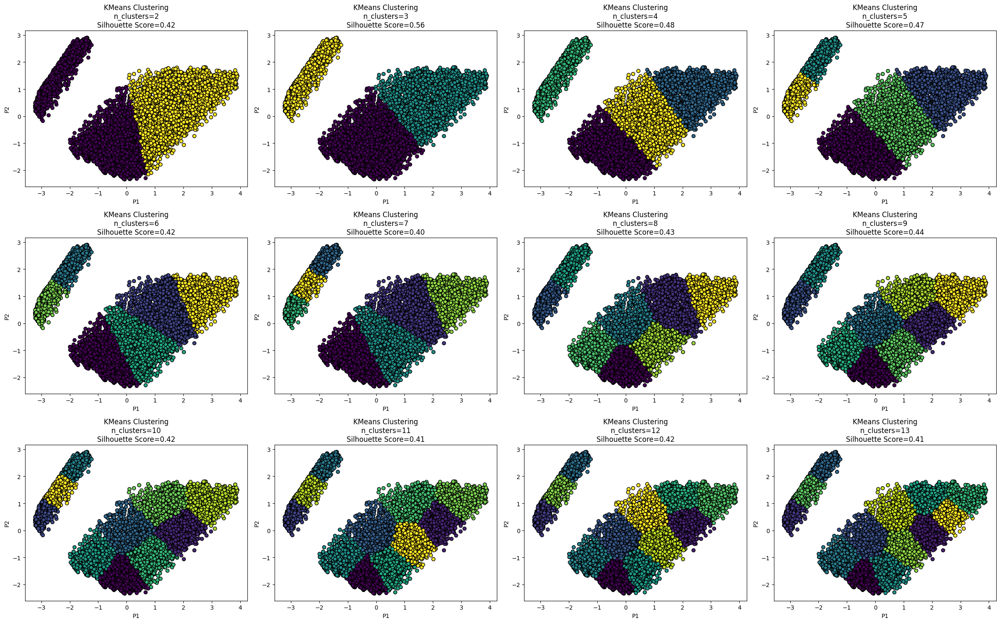

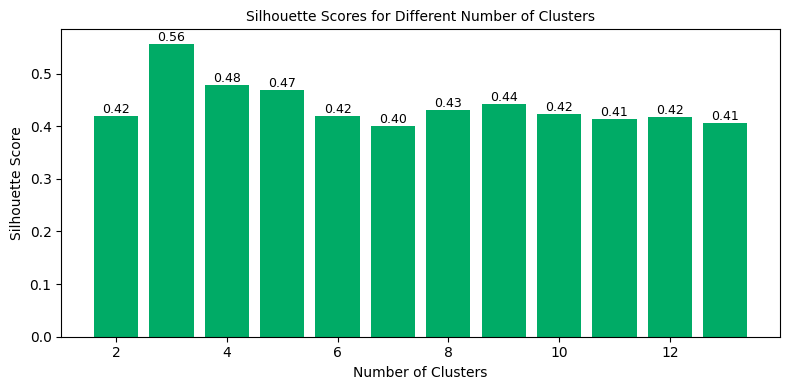

In [74]:
# KMeans (with PCA)

# Set up the figure and axes for subplots
n_clusters_range = range(2, 14)
fig, axs = plt.subplots(3, 4, figsize=(24, 15))
axs = axs.flatten()

silhouette_scores = []

for idx, n_clusters in enumerate(n_clusters_range):
    model = KMeans(n_clusters=n_clusters, random_state=10)
    labels = model.fit_predict(pca_df)

    # Calculate silhouette score
    score = silhouette_score(pca_df, labels)
    silhouette_scores.append(score)

    axs[idx].scatter(pca_df['P1'], pca_df['P2'], c=labels, cmap='viridis', edgecolor='k')
    axs[idx].set_title(f'KMeans Clustering\nn_clusters={n_clusters}\nSilhouette Score={score:.2f}')
    axs[idx].set_xlabel('P1')
    axs[idx].set_ylabel('P2')

    # Calculate DB score
    db_score = davies_bouldin_score(pca_df, labels)
    print(f"Davies-Bouldin Index for {n_clusters} clusters: {db_score}")

plt.tight_layout()
plt.show()

# Plot the silhouette scores
plt.figure(figsize=(8, 4))
bars = plt.bar(n_clusters_range, silhouette_scores, color='#00AB66')

plt.xlabel('Number of Clusters', fontsize=10)
plt.ylabel('Silhouette Score', fontsize=10)
plt.title('Silhouette Scores for Different Number of Clusters', fontsize=10)

for bar, score in zip(bars, silhouette_scores):
    plt.text(bar.get_x() + bar.get_width() / 2,
             bar.get_height(),
             f'{score:.2f}',
             ha='center',
             va='bottom',
             fontsize=9)

plt.tight_layout()
plt.show()

In [52]:

df_cluster = df.copy()

# Scale Tenure and Monthly Charges
scaler = StandardScaler()
df_cluster[['tenure', 'MonthlyCharges']] = scaler.fit_transform(df_cluster[['tenure', 'MonthlyCharges']])

#Selecting all variables except tenure and Monthly Charges
encoder = OrdinalEncoder()
df_cluster[df_cluster.columns[~df_cluster.columns.isin(['tenure','MonthlyCharges'])]] = encoder.fit_transform(df_cluster[df_cluster.columns[~df_cluster.columns.isin(['tenure','MonthlyCharges'])]])

In [53]:
kmeans = KMeans(n_clusters = 3)
kmeans.fit(df_cluster)
df_cluster['Cluster'] = kmeans.labels_

In [54]:
df_cluster
#df_cluster.to_csv('kmeans_pca_cluster.csv')

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Cluster
0,0.0,0.0,1.0,0.0,-1.277445,0.0,1.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,1.0,2.0,-1.160323,74.0,0.0,1
1,1.0,0.0,0.0,0.0,0.066327,1.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,1.0,0.0,3.0,-0.259629,3625.0,0.0,0
2,1.0,0.0,0.0,0.0,-1.236724,1.0,0.0,0.0,2.0,2.0,...,0.0,0.0,0.0,0.0,1.0,3.0,-0.362660,536.0,1.0,1
3,1.0,0.0,0.0,0.0,0.514251,0.0,1.0,0.0,2.0,0.0,...,2.0,0.0,0.0,1.0,0.0,0.0,-0.746535,3571.0,0.0,0
4,0.0,0.0,0.0,0.0,-1.236724,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,2.0,0.197365,674.0,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1.0,0.0,1.0,1.0,-0.340876,1.0,2.0,0.0,2.0,0.0,...,2.0,2.0,2.0,1.0,1.0,3.0,0.665992,3701.0,0.0,0
7039,0.0,0.0,1.0,1.0,1.613701,1.0,2.0,1.0,0.0,2.0,...,0.0,2.0,2.0,1.0,1.0,1.0,1.277533,6305.0,0.0,2
7040,0.0,0.0,1.0,1.0,-0.870241,0.0,1.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,1.0,2.0,-1.168632,1265.0,0.0,1
7041,1.0,1.0,1.0,0.0,-1.155283,1.0,2.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,3.0,0.320338,1157.0,1.0,1


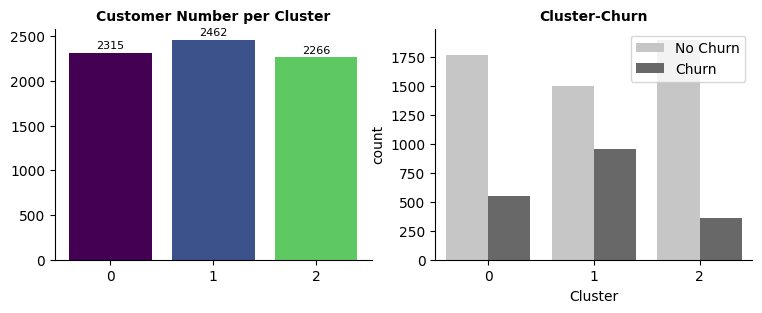

In [55]:
# Cluster Counts
fig, ax = plt.subplots(1,2, figsize=(9, 3))
data_temp = df_cluster['Cluster'].value_counts().sort_index()
ax[0].bar(data_temp.index, data_temp,
          color=['#440154', '#3b528b', '#5ec962']
        )
ax[0].set_xticks([0, 1, 2])
ax[0].set_xticklabels([0, 1, 2])
ax[0].set_title('Customer Number per Cluster', fontsize=10, fontweight='bold')
for i in data_temp.index:
    ax[0].annotate(f"{data_temp[i]}",
                   xy=(i, data_temp[i] + 80),
                   va = 'center', ha='center',fontweight='light',
                   color='black', fontsize=8)
for s in ['top', 'right']:
    ax[0].spines[s].set_visible(False)


sn.countplot(x='Cluster', hue="Churn", palette="Greys", data = df_cluster)
sn.despine()
plt.legend(title='', loc='upper right', labels=['No Churn', 'Churn'])
plt.title("Cluster-Churn", fontsize=10,fontweight='bold')
plt.show()

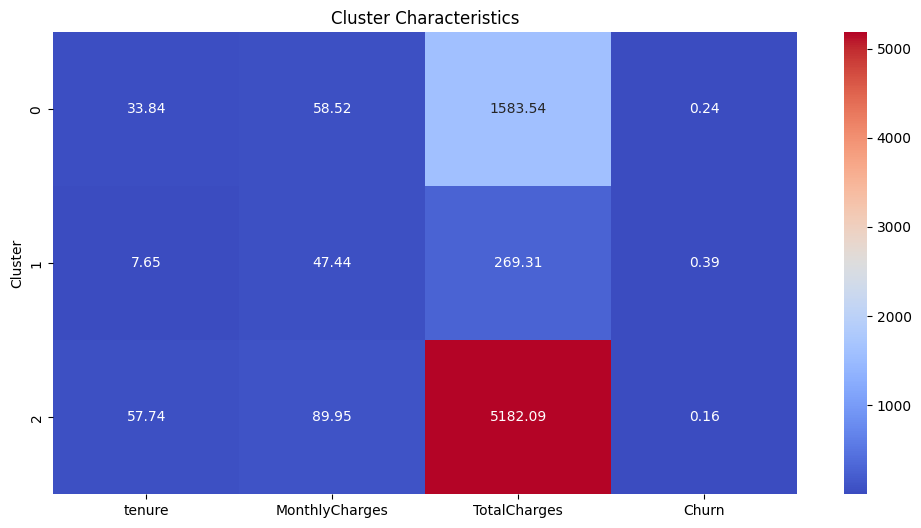

    gender  SeniorCitizen Partner Dependents  tenure PhoneService  \
1     Male              0      No         No      34          Yes   
3     Male              0      No         No      45           No   
5   Female              0      No         No       8          Yes   
6     Male              0      No        Yes      22          Yes   
14    Male              0      No         No      25          Yes   

       MultipleLines InternetService OnlineSecurity OnlineBackup  ...  \
1                 No             DSL            Yes           No  ...   
3   No phone service             DSL            Yes           No  ...   
5                Yes     Fiber optic             No           No  ...   
6                Yes     Fiber optic             No          Yes  ...   
14                No     Fiber optic            Yes           No  ...   

   TechSupport StreamingTV StreamingMovies        Contract PaperlessBilling  \
1           No          No              No        One year         

In [56]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

telco_dataset = pd.read_csv("./WA_Fn-UseC_-Telco-Customer-Churn.csv")
df = telco_dataset.copy()

df = df.drop(columns=['customerID'])

# Convert Churn to binary
df['Churn'] = df['Churn'].map({'No': 0, 'Yes': 1})

# Select Relevant Features for Clustering
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df['TotalCharges'] = df['TotalCharges'].fillna(df['TotalCharges'].median())

features = ['tenure', 'MonthlyCharges', 'TotalCharges', 'Churn']

scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[features])

cluster_labels = kmeans.labels_
df['Cluster'] = cluster_labels

# Analyze Each Cluster (calculate the mean of each feature for each cluster)
cluster_summary = df.groupby('Cluster')[features].mean()

plt.figure(figsize=(12, 6))
sns.heatmap(cluster_summary, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Cluster Characteristics')
plt.show()

# Save or Analyze Specific Clusters
cluster_0_customers = df[df['Cluster'] == 0]
print(cluster_0_customers.head())


Davies-Bouldin Index for 2 clusters: 1.0446573518469933
Davies-Bouldin Index for 3 clusters: 0.9177993213636907
Davies-Bouldin Index for 4 clusters: 0.9127689988740729
Davies-Bouldin Index for 5 clusters: 0.7850576056550537
Davies-Bouldin Index for 6 clusters: 0.774646473905522
Davies-Bouldin Index for 7 clusters: 0.735309105839916
Davies-Bouldin Index for 8 clusters: 0.7413944407329308
Davies-Bouldin Index for 9 clusters: 0.743865921494564
Davies-Bouldin Index for 10 clusters: 0.7635021021184198
Davies-Bouldin Index for 11 clusters: 0.7911718511650474
Davies-Bouldin Index for 12 clusters: 0.8123922636764246
Davies-Bouldin Index for 13 clusters: 0.7661119797086109
Davies-Bouldin Index for 14 clusters: 0.7724208886223912


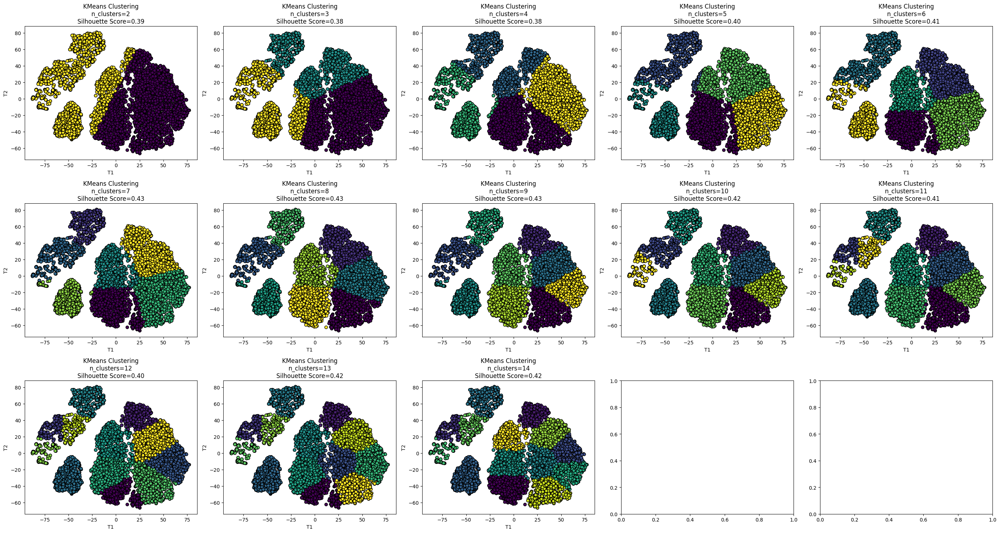

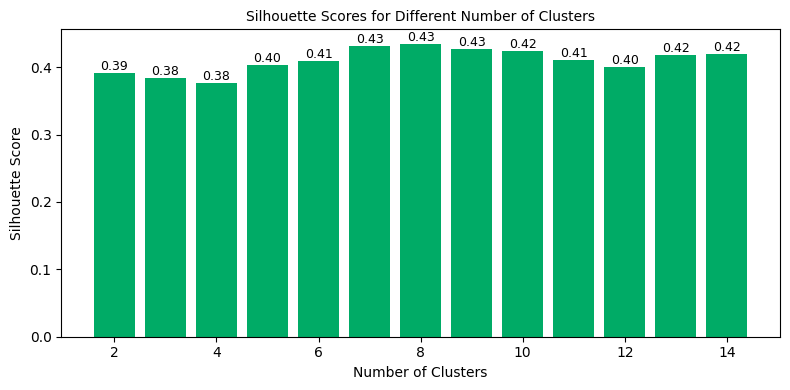

In [ ]:
# KMeans (with TSNE)

n_clusters_range = range(2, 14)
fig, axs = plt.subplots(3, 4, figsize=(24, 15))
axs = axs.flatten()

silhouette_scores = []

for idx, n_clusters in enumerate(n_clusters_range):
    # KMeans model
    model = KMeans(n_clusters=n_clusters, random_state=10)
    labels = model.fit_predict(tsne_df)

    # Calculate Silhouette score
    score = silhouette_score(tsne_df, labels)
    silhouette_scores.append(score)

    axs[idx].scatter(tsne_df['T1'], tsne_df['T2'], c=labels, cmap='viridis', edgecolor='k')
    axs[idx].set_title(f'KMeans Clustering\nn_clusters={n_clusters}\nSilhouette Score={score:.2f}')
    axs[idx].set_xlabel('T1')
    axs[idx].set_ylabel('T2')

    # Calculate DB score
    db_score = davies_bouldin_score(tsne_df, labels)
    print(f"Davies-Bouldin Index for {n_clusters} clusters: {db_score}")

plt.tight_layout()
plt.show()

# Plot silhouette scores
plt.figure(figsize=(8, 4))
bars = plt.bar(n_clusters_range, silhouette_scores, color='#00AB66')

plt.xlabel('Number of Clusters', fontsize=10)
plt.ylabel('Silhouette Score', fontsize=10)
plt.title('Silhouette Scores for Different Number of Clusters', fontsize=10)

for bar, score in zip(bars, silhouette_scores):
    plt.text(bar.get_x() + bar.get_width() / 2,
             bar.get_height(),
             f'{score:.2f}',
             ha='center',
             va='bottom',
             fontsize=9)

plt.tight_layout()
plt.show()

In [58]:

df_cluster = df.copy()

# Scale Tenure and Monthly Charges
scaler = StandardScaler()
df_cluster[['tenure', 'MonthlyCharges']] = scaler.fit_transform(df_cluster[['tenure', 'MonthlyCharges']])

#Selecting all variables except tenure and Monthly Charges
encoder = OrdinalEncoder()
df_cluster[df_cluster.columns[~df_cluster.columns.isin(['tenure','MonthlyCharges'])]] = encoder.fit_transform(df_cluster[df_cluster.columns[~df_cluster.columns.isin(['tenure','MonthlyCharges'])]])

In [59]:
kmeans = KMeans(n_clusters = 3)
kmeans.fit(df_cluster)
df_cluster['Cluster'] = kmeans.labels_

In [60]:
df_cluster
#df_cluster.to_csv('kmeans_tsne_cluster.csv')

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Cluster
0,0.0,0.0,1.0,0.0,-1.277445,0.0,1.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,1.0,2.0,-1.160323,74.0,0.0,0
1,1.0,0.0,0.0,0.0,0.066327,1.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,1.0,0.0,3.0,-0.259629,3625.0,0.0,2
2,1.0,0.0,0.0,0.0,-1.236724,1.0,0.0,0.0,2.0,2.0,...,0.0,0.0,0.0,0.0,1.0,3.0,-0.362660,536.0,1.0,0
3,1.0,0.0,0.0,0.0,0.514251,0.0,1.0,0.0,2.0,0.0,...,2.0,0.0,0.0,1.0,0.0,0.0,-0.746535,3571.0,0.0,2
4,0.0,0.0,0.0,0.0,-1.236724,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,2.0,0.197365,674.0,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1.0,0.0,1.0,1.0,-0.340876,1.0,2.0,0.0,2.0,0.0,...,2.0,2.0,2.0,1.0,1.0,3.0,0.665992,3701.0,0.0,2
7039,0.0,0.0,1.0,1.0,1.613701,1.0,2.0,1.0,0.0,2.0,...,0.0,2.0,2.0,1.0,1.0,1.0,1.277533,6305.0,0.0,1
7040,0.0,0.0,1.0,1.0,-0.870241,0.0,1.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,1.0,2.0,-1.168632,1265.0,0.0,0
7041,1.0,1.0,1.0,0.0,-1.155283,1.0,2.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,3.0,0.320338,1157.0,1.0,0


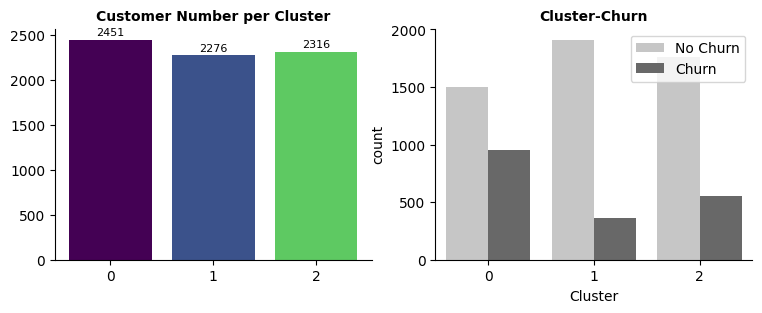

In [61]:
# Cluster Counts
fig, ax = plt.subplots(1,2, figsize=(9, 3))
data_temp = df_cluster['Cluster'].value_counts().sort_index()
ax[0].bar(data_temp.index, data_temp,
          color=['#440154', '#3b528b', '#5ec962']
        )
ax[0].set_xticks([0, 1, 2])
ax[0].set_xticklabels([0, 1, 2])
ax[0].set_title('Customer Number per Cluster', fontsize=10, fontweight='bold')
for i in data_temp.index:
    ax[0].annotate(f"{data_temp[i]}",
                   xy=(i, data_temp[i] + 80),
                   va = 'center', ha='center',fontweight='light',
                   color='black', fontsize=8)
for s in ['top', 'right']:
    ax[0].spines[s].set_visible(False)


sn.countplot(x='Cluster', hue="Churn", palette="Greys", data = df_cluster)
sn.despine()
plt.legend(title='', loc='upper right', labels=['No Churn', 'Churn'])
plt.title("Cluster-Churn", fontsize=10,fontweight='bold')
plt.show()

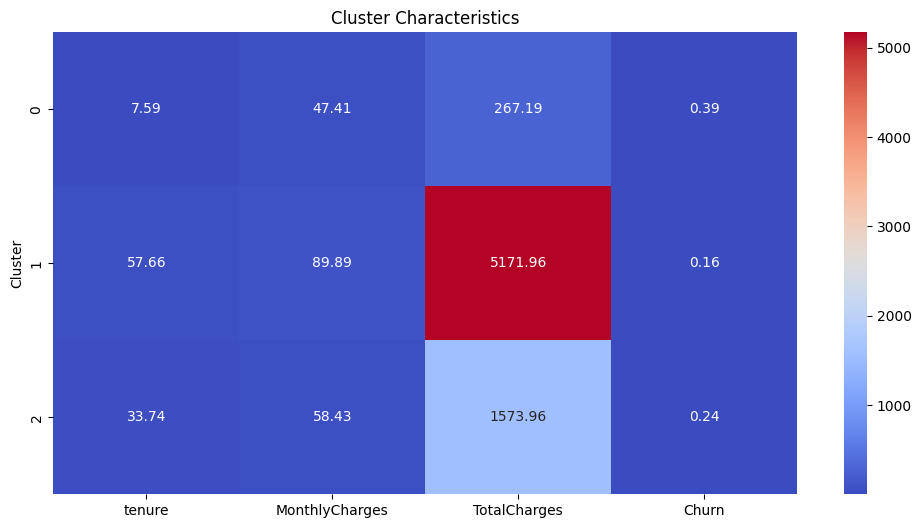

    gender  SeniorCitizen Partner Dependents  tenure PhoneService  \
0   Female              0     Yes         No       1           No   
2     Male              0      No         No       2          Yes   
4   Female              0      No         No       2          Yes   
7   Female              0      No         No      10           No   
10    Male              0     Yes        Yes      13          Yes   

       MultipleLines InternetService OnlineSecurity OnlineBackup  ...  \
0   No phone service             DSL             No          Yes  ...   
2                 No             DSL            Yes          Yes  ...   
4                 No     Fiber optic             No           No  ...   
7   No phone service             DSL            Yes           No  ...   
10                No             DSL            Yes           No  ...   

   TechSupport StreamingTV StreamingMovies        Contract PaperlessBilling  \
0           No          No              No  Month-to-month         

In [62]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

telco_dataset = pd.read_csv("./WA_Fn-UseC_-Telco-Customer-Churn.csv")
df = telco_dataset.copy()

df = df.drop(columns=['customerID'])

# Convert Churn to binary
df['Churn'] = df['Churn'].map({'No': 0, 'Yes': 1})

# Select Relevant Features for Clustering
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df['TotalCharges'] = df['TotalCharges'].fillna(df['TotalCharges'].median())

features = ['tenure', 'MonthlyCharges', 'TotalCharges', 'Churn']

scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[features])

cluster_labels = kmeans.labels_
df['Cluster'] = cluster_labels

# Analyze Each Cluster (calculate the mean of each feature for each cluster)
cluster_summary = df.groupby('Cluster')[features].mean()

plt.figure(figsize=(12, 6))
sns.heatmap(cluster_summary, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Cluster Characteristics')
plt.show()

# Save or Analyze Specific Clusters
cluster_0_customers = df[df['Cluster'] == 0]
print(cluster_0_customers.head())


In [63]:
# K-Means with t-SNE with 7 clusters

df_cluster = df.copy()

# Scale Tenure and Monthly Charges
scaler = StandardScaler()
df_cluster[['tenure', 'MonthlyCharges']] = scaler.fit_transform(df_cluster[['tenure', 'MonthlyCharges']])

#Selecting all variables except tenure and Monthly Charges
encoder = OrdinalEncoder()
df_cluster[df_cluster.columns[~df_cluster.columns.isin(['tenure','MonthlyCharges'])]] = encoder.fit_transform(df_cluster[df_cluster.columns[~df_cluster.columns.isin(['tenure','MonthlyCharges'])]])

In [64]:
kmeans = KMeans(n_clusters = 7)
kmeans.fit(df_cluster)
df_cluster['Cluster'] = kmeans.labels_

In [65]:
df_cluster
#df_cluster.to_csv('kmeans_tsne_cluster.csv')

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,Cluster
0,0.0,0.0,1.0,0.0,-1.277445,0.0,1.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,1.0,2.0,-1.160323,74.0,0.0,4
1,1.0,0.0,0.0,0.0,0.066327,1.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,1.0,0.0,3.0,-0.259629,3625.0,0.0,2
2,1.0,0.0,0.0,0.0,-1.236724,1.0,0.0,0.0,2.0,2.0,...,0.0,0.0,0.0,0.0,1.0,3.0,-0.362660,536.0,1.0,4
3,1.0,0.0,0.0,0.0,0.514251,0.0,1.0,0.0,2.0,0.0,...,2.0,0.0,0.0,1.0,0.0,0.0,-0.746535,3571.0,0.0,2
4,0.0,0.0,0.0,0.0,-1.236724,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,2.0,0.197365,674.0,1.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1.0,0.0,1.0,1.0,-0.340876,1.0,2.0,0.0,2.0,0.0,...,2.0,2.0,2.0,1.0,1.0,3.0,0.665992,3701.0,0.0,2
7039,0.0,0.0,1.0,1.0,1.613701,1.0,2.0,1.0,0.0,2.0,...,0.0,2.0,2.0,1.0,1.0,1.0,1.277533,6305.0,0.0,0
7040,0.0,0.0,1.0,1.0,-0.870241,0.0,1.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,1.0,2.0,-1.168632,1265.0,0.0,1
7041,1.0,1.0,1.0,0.0,-1.155283,1.0,2.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,3.0,0.320338,1157.0,1.0,1


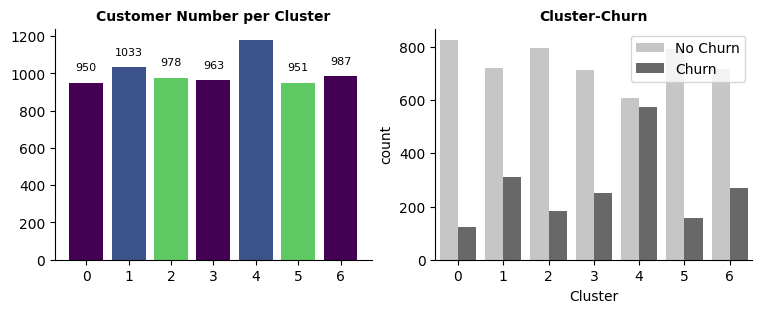

In [66]:
# Cluster Counts
fig, ax = plt.subplots(1,2, figsize=(9, 3))
data_temp = df_cluster['Cluster'].value_counts().sort_index()
ax[0].bar(data_temp.index, data_temp,
          color=['#440154', '#3b528b', '#5ec962', '#440154', '#3b528b', '#5ec962', '#440154']
        )
ax[0].set_xticks([0, 1, 2, 3, 4, 5, 6])
ax[0].set_xticklabels([0, 1, 2, 3, 4, 5, 6])
ax[0].set_title('Customer Number per Cluster', fontsize=10, fontweight='bold')
for i in data_temp.index:
    ax[0].annotate(f"{data_temp[i]}",
                   xy=(i, data_temp[i] + 80),
                   va = 'center', ha='center',fontweight='light',
                   color='black', fontsize=8)
for s in ['top', 'right']:
    ax[0].spines[s].set_visible(False)


sn.countplot(x='Cluster', hue="Churn", palette="Greys", data = df_cluster)
sn.despine()
plt.legend(title='', loc='upper right', labels=['No Churn', 'Churn'])
plt.title("Cluster-Churn", fontsize=10,fontweight='bold')
plt.show()

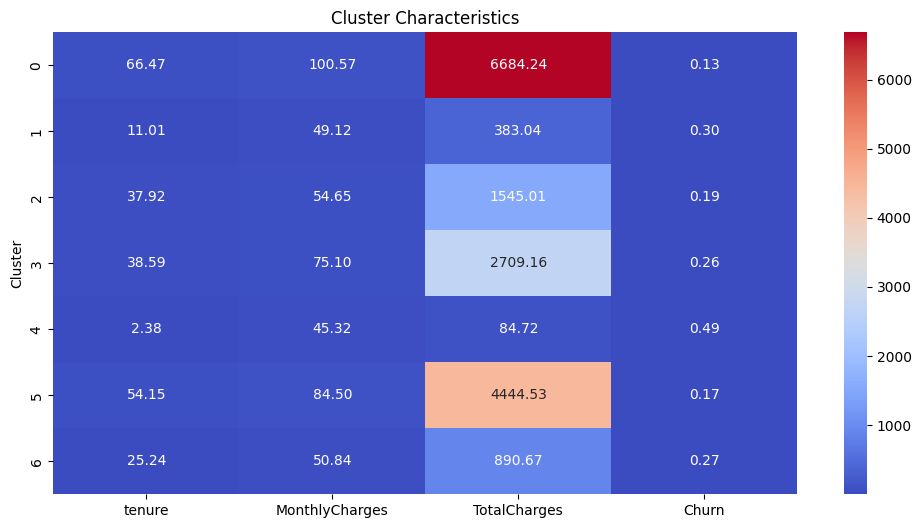

    gender  SeniorCitizen Partner Dependents  tenure PhoneService  \
12    Male              0     Yes         No      58          Yes   
15  Female              0     Yes        Yes      69          Yes   
17    Male              0      No        Yes      71          Yes   
28    Male              0     Yes         No      72          Yes   
30  Female              1     Yes         No      71          Yes   

   MultipleLines InternetService OnlineSecurity OnlineBackup  ... TechSupport  \
12           Yes     Fiber optic             No           No  ...          No   
15           Yes     Fiber optic            Yes          Yes  ...         Yes   
17           Yes     Fiber optic            Yes           No  ...          No   
28           Yes             DSL            Yes          Yes  ...         Yes   
30           Yes     Fiber optic            Yes          Yes  ...         Yes   

   StreamingTV StreamingMovies  Contract PaperlessBilling  \
12         Yes             Yes  One y

In [67]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

telco_dataset = pd.read_csv("./WA_Fn-UseC_-Telco-Customer-Churn.csv")
df = telco_dataset.copy()

df = df.drop(columns=['customerID'])

# Convert Churn to binary
df['Churn'] = df['Churn'].map({'No': 0, 'Yes': 1})

# Select Relevant Features for Clustering
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df['TotalCharges'] = df['TotalCharges'].fillna(df['TotalCharges'].median())

features = ['tenure', 'MonthlyCharges', 'TotalCharges', 'Churn']

scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[features])

cluster_labels = kmeans.labels_
df['Cluster'] = cluster_labels

# Analyze Each Cluster (calculate the mean of each feature for each cluster)
cluster_summary = df.groupby('Cluster')[features].mean()

plt.figure(figsize=(12, 6))
sns.heatmap(cluster_summary, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Cluster Characteristics')
plt.show()

# Save or Analyze Specific Clusters
cluster_0_customers = df[df['Cluster'] == 0]
print(cluster_0_customers.head())
